---
# <center> **COMPUTER VISION** </center>
---
# <center> **Lab 2.1: Pixel Operators and Image Filtering** </center>
---

## **Table of Contents**

1. Setup and Libraries
2. Load Sample Image
3. Part I: Point Operators
   - Brightness Modification
   - Contrast Modification
   - Image Negation
   - Thresholding
4. Part II: Linear Filters
   - Mean Filter
   - Gaussian Filter
   - Sharpen Filter
5. Part III: Advanced Filters
   - Sobel Edge, Prewitt Edge Detection
   - Custom kernel design
   - Comparing different types of filters
   - Applying nonlinear filtering: median filter, bilateral filter


---

## 1. Setup and Libraries

In [119]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

print("Libraries imported successfully")
print(f"OpenCV version: {cv2.__version__}")
print(f"NumPy version: {np.__version__}")

Libraries imported successfully
OpenCV version: 4.13.0
NumPy version: 2.2.6


---

## 2. Load Sample Image

In [120]:
def convert_bgr2rgb(image):
    """Converts an image from BGR to RGB color space.

    Args:
        image (np.ndarray): The input image in BGR format.

    Returns:
        np.ndarray: The converted image in RGB format.
    """
    image_converted = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image_converted

Image shape: (425, 640, 3)
Image dtype: uint8


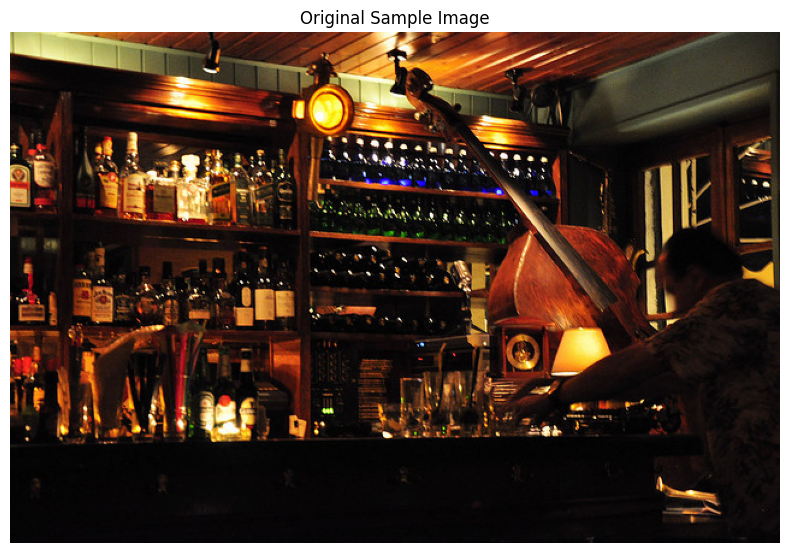

In [121]:
original_image = cv2.imread('../assets/000000117719.jpg')   # read image with cv2

print(f"Image shape: {original_image.shape}")                                                                               # type: ignore
print(f"Image dtype: {original_image.dtype}")                                                                               # type: ignore

plt.figure(figsize=(8, 6))
plt.imshow(convert_bgr2rgb(original_image))
plt.title('Original Sample Image')
plt.axis('off')
plt.tight_layout()
plt.show()

---

## 3. Part I: Point Operators

Point operators modify individual pixel values. Formula: Output(x,y) = f(Input(x,y))



In [122]:
def pixel_transform(image, contrast=1.0, brightness=0):
    """Adjusts image contrast and brightness using a linear transformation.

    Args:
        image (np.ndarray): The input image.
        alpha (float, optional): Contrast control (gain). Defaults to 1.0.
        beta (int, optional): Brightness control (bias). Defaults to 0.

    Returns:
        np.ndarray: The transformed image with pixel values clipped to.
    """
    img_pixel = np.array(image, dtype=np.float32)

    # Thực hiện phép toán tuyến tính trên toàn bộ mảng
    output = contrast * img_pixel + brightness

    return np.clip(output, 0, 255).astype(np.uint8)

### 3.1 Brightness Modification

Formula for increasing brightness: O(x,y) = I(x,y) + delta


Formula for decreasing brightness: O(x,y) = I(x,y) - delta

In [123]:
# Maintain contrast, change brightness.
delta = 50
bright_image = pixel_transform(original_image, contrast=1, brightness=delta)    # tăng độ sáng
dark_image = pixel_transform(original_image, contrast=1, brightness=-delta)     # giảm độ sáng

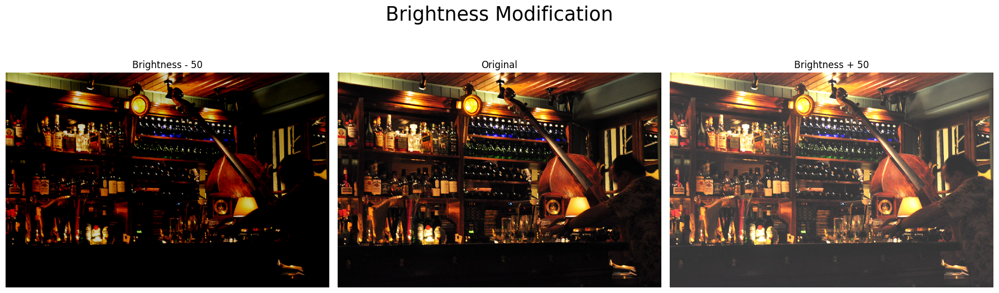

In [124]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# display dark_image
axes[0].imshow(convert_bgr2rgb(dark_image))
axes[0].set_title(f'Brightness - {delta}')
axes[0].axis('off')

# display original_image
axes[1].imshow(convert_bgr2rgb(original_image))
axes[1].set_title('Original')
axes[1].axis('off')

# display bright_image
axes[2].imshow(convert_bgr2rgb(bright_image))
axes[2].set_title(f'Brightness + {delta}')
axes[2].axis('off')

plt.suptitle('Brightness Modification', fontsize=25)
plt.tight_layout()
plt.show()

---

### 3.2 Contrast Modification

Formula for increasing contrast: O(x,y) = I(x,y) * factor where factor > 1.0


Formula for decreasing contrast: O(x,y) = I(x,y) * factor where 0 < factor < 1.0

In [125]:
# Keep the brightness the same, change the contrast.
high_contrast = pixel_transform(original_image, contrast=1.5, brightness=0)  
low_contrast = pixel_transform(original_image, contrast=0.7, brightness=0)

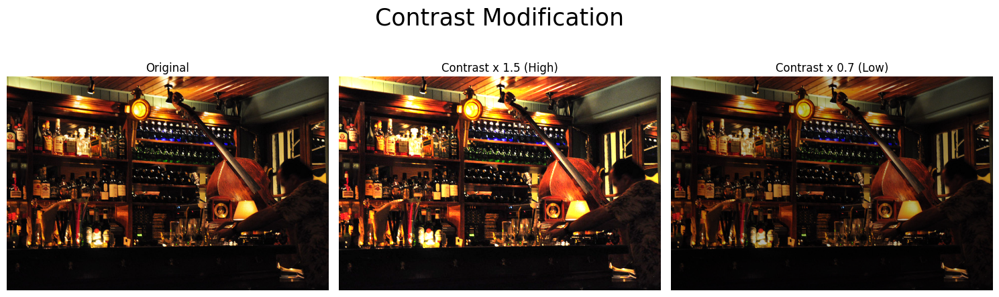

In [126]:
# Display comparison
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(convert_bgr2rgb(original_image))
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(convert_bgr2rgb(high_contrast))
axes[1].set_title('Contrast x 1.5 (High)')
axes[1].axis('off')

axes[2].imshow(convert_bgr2rgb(low_contrast))
axes[2].set_title('Contrast x 0.7 (Low)')
axes[2].axis('off')

plt.suptitle('Contrast Modification', fontsize=25)
plt.tight_layout()
plt.show()

---

### 3.3 Image Negation

Formula for negation: O(x,y) = 255 - I(x,y)

In [127]:
def negate_image(image):
    """Creates a negative image by inverting its pixel values.

    Args:
        image (np.ndarray): The input image.

    Returns:
        np.ndarray: The inverted (negative) image.
    """
    img_pixel = np.array(image, dtype=np.float32)
    output = 255 - img_pixel    

    return np.clip(output, 0, 255).astype(np.uint8)

In [128]:
# read new image
original_image = cv2.imread('../assets/000000113867.jpg')
negative_img = negate_image(original_image)

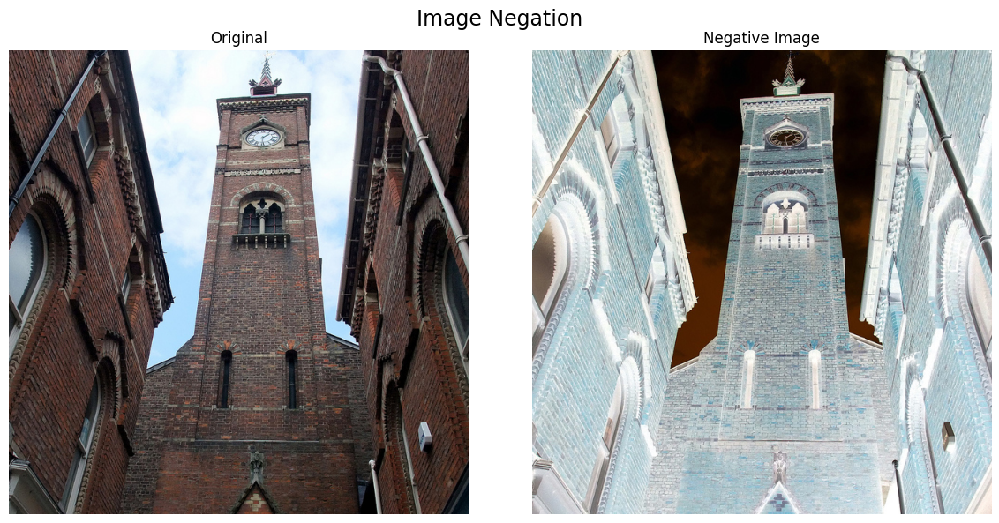

In [129]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(convert_bgr2rgb(original_image))
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(convert_bgr2rgb(negative_img))
axes[1].set_title('Negative Image')
axes[1].axis('off')

plt.suptitle('Image Negation', fontsize=17)
plt.tight_layout()
plt.show()

---

### 3.4 Thresholding 
Formula for thresholding: O(x,y) = 255 if I(x,y) >= T else 0

In [130]:
def threshold_image(image, threshold=128):
    """Converts a BGR image to binary using a fixed threshold.

    Args:
        image (np.ndarray): Input BGR image.
        threshold (int, optional): Threshold value. Defaults to 128.

    Returns:
        np.ndarray: Binary image.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, threshold, maxval=255, type=cv2.THRESH_BINARY)
    return _, binary

In [131]:
# Read image, convert to grey scale ('L')
original_image = cv2.imread('../assets/000000292415.jpg')
img_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)                                                                                     # type: ignore

# C1. Use a fixed threshold.
#  fixed threshold T = 128
_, img_binary = threshold_image(original_image, threshold=128)

# C2. Use Otsu
otsu_thresh, img_otsu = cv2.threshold(img_gray, thresh=0, maxval=255, type=cv2.THRESH_BINARY | cv2.THRESH_OTSU)                                  

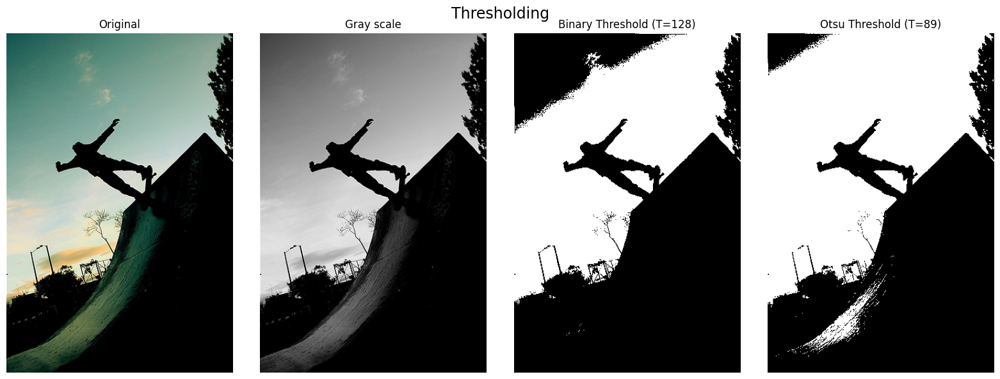

In [132]:
# Display comparison
fig, axes = plt.subplots(1, 4, figsize=(16, 6))

# original_image
axes[0].imshow(convert_bgr2rgb(original_image))
axes[0].set_title('Original')
axes[0].axis('off')

# gray scale (reference)
axes[1].imshow(img_gray, cmap='gray')                                                            
axes[1].set_title('Gray scale')
axes[1].axis('off')

# img_binary
axes[2].imshow(img_binary, cmap='gray')
axes[2].set_title('Binary Threshold (T=128)')
axes[2].axis('off')

# img_otsu (img_binary by Otsu)
axes[3].imshow(img_otsu, cmap='gray')
axes[3].set_title(f'Otsu Threshold (T={int(otsu_thresh)})')
axes[3].axis('off')

plt.suptitle('Thresholding', fontsize=17)
plt.tight_layout()
plt.show()

---

## 4. Part II: Linear Filters

Linear filters apply convolution operation using kernels. They consider neighboring pixels.


### 4.1 Mean Filter
Mean filter replaces each pixel with average of its neighbors. Formula: O(x,y) = average of neighborhood

$$\text{Kernel}_{3\times3} = \frac{1}{9} \begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\ 1 & 1 & 1 \end{bmatrix}$$

In [133]:
def apply_mean_filter(image, kernel_size=3):
    """Applies a mean filter to smooth the image.

    Args:
        image (np.ndarray): The input image.
        kernel_size (int, optional): Size of the blur kernel. Defaults to 3.

    Returns:
        np.ndarray: The smoothed image.
    """
    return cv2.blur(src=image, ksize=(kernel_size, kernel_size))


### 4.2 Filter Gaussian


$\sigma = 1.0$
$$\text{Kernel}_{3\times3} = \frac{1}{16} \begin{bmatrix} 1 & 2 & 1 \\ 2 & 4 & 2 \\ 1 & 2 & 1 \end{bmatrix}$$

In [134]:
def apply_gaussian_filter(image, kernel_size=3, sigma=1.0):
    """Applies a Gaussian filter to blur the image and reduce noise.

    Args:
        image (np.ndarray): The input image.
        kernel_size (int, optional): Size of the Gaussian kernel. Defaults to 3.
        sigma (float, optional): Gaussian kernel standard deviation. Defaults to 1.0.

    Returns:
        np.ndarray: The blurred image.
    """
    return cv2.GaussianBlur(src=image, ksize=(kernel_size, kernel_size), sigmaX=sigma)

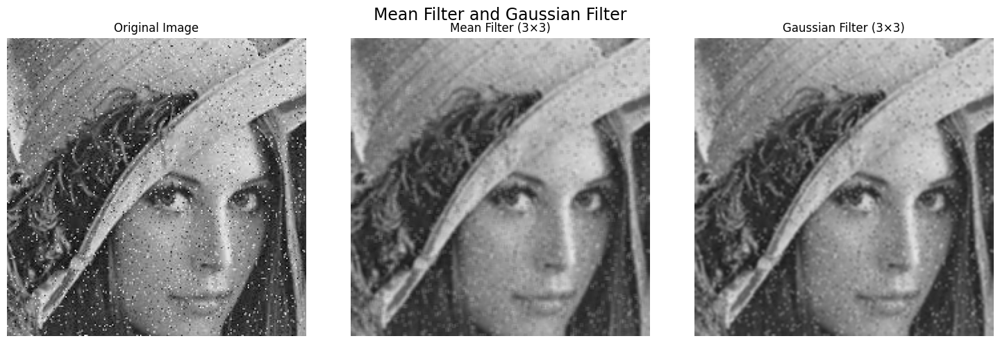

In [135]:
original_image = cv2.imread('../assets/images.jpeg')

# Apply filters
mean_filtered = apply_mean_filter(original_image, kernel_size=3)
gaussian_filtered = apply_gaussian_filter(original_image, kernel_size=3, sigma=1)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Image
axes[0].imshow(convert_bgr2rgb(original_image))
axes[0].set_title("Original Image")
axes[0].axis("off")

# Mean Filter
axes[1].imshow(convert_bgr2rgb(mean_filtered))
axes[1].set_title("Mean Filter (3×3)")
axes[1].axis("off")

# Gaussian Filter
axes[2].imshow(convert_bgr2rgb(gaussian_filtered))
axes[2].set_title("Gaussian Filter (3×3)")
axes[2].axis("off")

plt.suptitle("Mean Filter and Gaussian Filter", fontsize=17)
plt.tight_layout()
plt.show()

| Tiêu chí                          | Mean Filter (3×3)                                           | Gaussian Filter (3×3)                                                    |
| --------------------------------- | ----------------------------------------------------------- | ------------------------------------------------------------------------ |
| **Khả năng giảm nhiễu muối tiêu** | Giảm được một phần nhiễu nhưng vẫn còn khá nhiều điểm nhiễu | Giảm nhiễu tốt hơn, ảnh trông mượt hơn                                   |
| **Độ mờ của ảnh**                 | Làm mờ tương đối đồng đều trên toàn ảnh                     | Làm mờ tự nhiên hơn do ưu tiên vùng trung tâm                            |
| **Khả năng giữ chi tiết**         | Một số chi tiết nhỏ (tóc, mắt) bị nhòe rõ rệt               | Giữ được nhiều chi tiết hơn so với Mean Filter                           |
| **Khả năng giữ biên (edges)**     | Biên bị làm mờ đáng kể                                      | Biên được bảo toàn tốt hơn, ít bị nhòe                                   |
| **Chất lượng thị giác**           | Ảnh có cảm giác mờ và mất độ sắc nét                        | Ảnh cân bằng hơn giữa giảm nhiễu và giữ chi tiết                         |
| **Đánh giá trên ảnh thử nghiệm**  | Hiệu quả nhưng làm mất nhiều thông tin chi tiết             | Cho kết quả tốt hơn, phù hợp để tiền xử lý trước các bước xử lý ảnh khác |


---

### 4.3 Sharpen Filter

In [136]:
def apply_sharpen_filter(image, kernel):
    """Apply a custom sharpening kernel to an image.

    Args:
        image (np.ndarray): The input image.
        kernel (np.ndarray): The sharpening kernel.

    Returns:
        np.ndarray: The filtered image.
    """
    result = cv2.filter2D(src=image, ddepth=cv2.CV_32F, kernel=kernel)
    return np.clip(result, 0, 255).astype(np.uint8)


kernel_sharpen = np.array([
    [0, -1, 0],
    [-1,  5, -1],
    [0, -1, 0]
])

kernel_strong_sharpen = np.array([
    [-1, -1, -1],
    [-1,  9, -1],
    [-1, -1, -1]
])

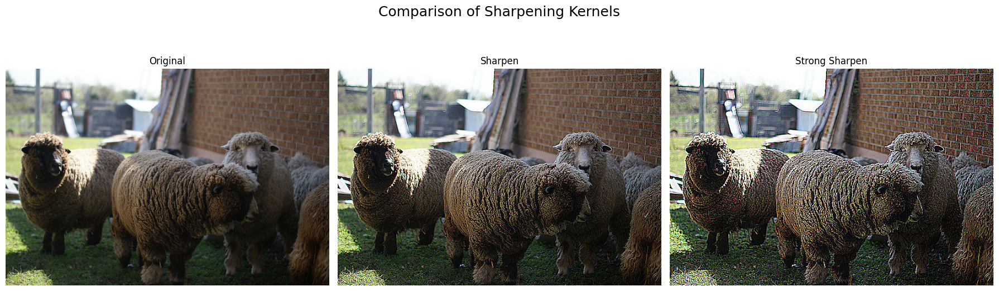

In [137]:
original_image = cv2.imread('../assets/000000005992.jpg')

# apply sharpen_filter
sharpened = apply_sharpen_filter(original_image, kernel=kernel_sharpen)
strong_sharpen = apply_sharpen_filter(original_image, kernel=kernel_strong_sharpen)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original image
axes[0].imshow(X=convert_bgr2rgb(image=original_image))
axes[0].set_title("Original")
axes[0].axis("off")

# Standard sharpen
axes[1].imshow(X=convert_bgr2rgb(image=sharpened))
axes[1].set_title("Sharpen")
axes[1].axis("off")

# Strong sharpen
axes[2].imshow(X=convert_bgr2rgb(image=strong_sharpen))
axes[2].set_title("Strong Sharpen")
axes[2].axis("off")

plt.suptitle("Comparison of Sharpening Kernels", fontsize=18)
plt.tight_layout()
plt.show()

---

## 5. Part III: Advanced exercises

### 5.1.1 Sobel Edge Detection

Bộ lọc SobelKernel Sobel cải tiến hơn Prewitt bằng cách tăng trọng số cho pixel ở tâm (giá trị 2 và -2). Điều này giúp bộ lọc có khả năng lọc bớt nhiễu nhẹ và làm mịn mượt đường biên tốt hơn Prewitt:$$K_x = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}, \quad K_y = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}$$


In [138]:
def apply_sobel_filter(image):
    """
    Apply Sobel edge detection to a grayscale image.

    Args:
        image: Input grayscale image.

    Returns:
        Edge magnitude image.
    """

    gx = cv2.Sobel(src=image, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=3)
    gy = cv2.Sobel(src=image, ddepth=cv2.CV_32F, dx=0, dy=1, ksize=3)

    magnitude = np.sqrt(gx**2 + gy**2)
    return np.clip(a=magnitude, a_min=0, a_max=255).astype(np.uint8)

### 5.1.2 Prewitt Edge Detection
Bộ lọc PrewittKernel Prewitt tính toán sự chênh lệch đơn giản giữa các pixel lân cận:$$K_x = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}, \quad K_y = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}$$

In [139]:
def apply_prewitt_filter(image):
    """
    Apply Prewitt edge detection to a grayscale image.

    Args:
        image: Input grayscale image.

    Returns:
        Edge magnitude image.
    """

    image = image.astype(np.float32)

    kernel_x = np.array(
        [[-1, 0, 1],
         [-1, 0, 1],
         [-1, 0, 1]],
        dtype=np.float32
    )

    kernel_y = np.array(
        [[-1, -1, -1],
         [ 0,  0,  0],
         [ 1,  1,  1]],
        dtype=np.float32
    )

    gx = cv2.filter2D(src=image, ddepth=cv2.CV_32F, kernel=kernel_x)
    gy = cv2.filter2D(src=image, ddepth=cv2.CV_32F, kernel=kernel_y)

    magnitude = np.sqrt(gx**2 + gy**2)
    return np.clip(a=magnitude, a_min=0, a_max=255).astype(np.uint8)

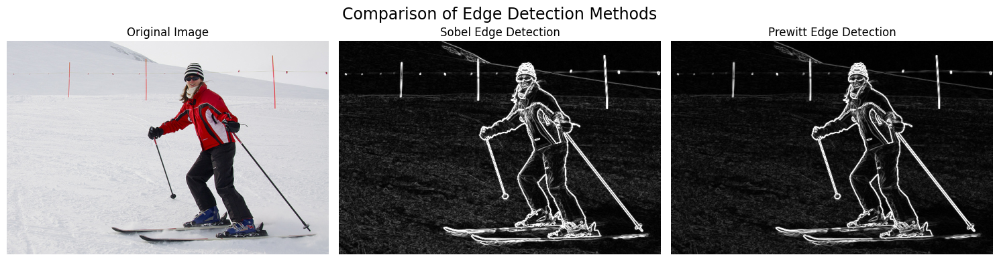

In [140]:
original_image = cv2.imread('../assets/000000000785.jpg')
gray_img = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)                                                                                     # type: ignore

sobel_edges = apply_sobel_filter(gray_img)    # Áp dụng Sobel 
prewitt_edges = apply_prewitt_filter(gray_img)    # Áp dụng Prewitt

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# original image
axes[0].imshow(convert_bgr2rgb(original_image))
axes[0].set_title("Original Image")
axes[0].axis("off")

# Sobel detect
axes[1].imshow(sobel_edges, cmap="gray")
axes[1].set_title("Sobel Edge Detection")
axes[1].axis("off")

# Prewitt detect
axes[2].imshow(prewitt_edges, cmap="gray")
axes[2].set_title("Prewitt Edge Detection")
axes[2].axis("off")


plt.suptitle("Comparison of Edge Detection Methods", fontsize=17)
plt.tight_layout()
plt.show()

| Tiêu chí                        | Sobel                                             | Prewitt                                                |
| ------------------------------- | ------------------------------------------------- | ------------------------------------------------------ |
| **Khả năng phát hiện cạnh**     | Phát hiện rõ các đường biên của người và vật thể  | Phát hiện cạnh tương tự Sobel                          |
| **Độ rõ của cạnh**              | Cạnh hơi đậm và nổi bật hơn                       | Cạnh mảnh hơn một chút                                 |
| **Độ nhạy với nhiễu**           | Ít nhạy với nhiễu hơn                             | Nhạy với nhiễu hơn một chút                            |
| **Kết quả trên ảnh thử nghiệm** | Hầu như không có khác biệt đáng kể so với Prewitt | Hầu như không có khác biệt đáng kể so với Sobel        |
| **Ứng dụng**                    | Thường được ưu tiên trong thực tế                 | Thường dùng để minh họa hoặc trong các bài toán cơ bản |


---

### 5.2 Custom Kernel Design for Different Image Effects
#### Emboss Kernel

* Tạo hiệu ứng **chạm nổi (3D-like)** bằng cách nhấn mạnh sự thay đổi cường độ sáng theo một hướng nhất định.
* Thường được sử dụng để tạo hiệu ứng nghệ thuật và làm nổi bật kết cấu (texture) của ảnh.

#### Laplacian Kernel

* Phát hiện **cạnh và các chi tiết nhỏ** bằng cách làm nổi bật những vùng có sự thay đổi cường độ sáng đột ngột.
* Dựa trên **đạo hàm bậc hai**, thường được sử dụng trong các bài toán phát hiện cạnh và làm sắc nét ảnh.


In [ ]:
# Emboss kernel
kernel_emboss = np.array([
    [-2, -1, 0],
    [-1,  1, 1],
    [ 0,  1, 2]
])

# Laplacian kernel
kernel_laplacian = np.array([
    [0, -1, 0],
    [-1, 4, -1],
    [0, -1, 0]
])

# Read new image
original_image = cv2.imread('../assets/000000006040.jpg')
gray_img = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)   # gray scale                                                   # type: ignore

# Apply kernels
img_emboss = cv2.filter2D(src=original_image, ddepth=-1, kernel=kernel_emboss)                                               # type: ignore
img_laplacian = cv2.filter2D(src=gray_img, ddepth=-1, kernel=kernel_laplacian)

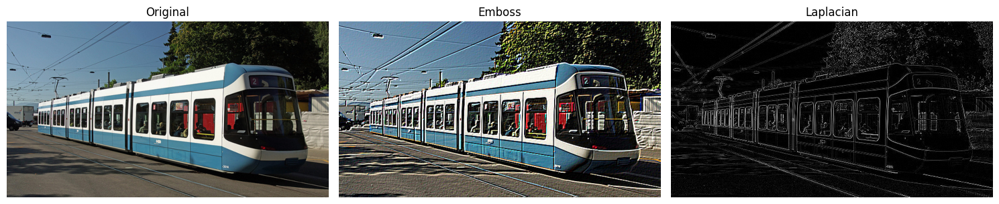

In [142]:
fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(15, 5)
)

# Original image
axes[0].imshow(X=convert_bgr2rgb(image=original_image))
axes[0].set_title("Original")
axes[0].axis("off")

# Emboss result
axes[1].imshow(X=convert_bgr2rgb(image=img_emboss))
axes[1].set_title("Emboss")
axes[1].axis("off")

# Laplacian result
axes[2].imshow(X=img_laplacian, cmap="gray")
axes[2].set_title("Laplacian")
axes[2].axis("off")

plt.tight_layout()
plt.show()

### 5.3 Comparison of Different Image Filtering Methods
- Nội dung 4.1, 4.2 và 5.1
---

### 5.4 Non-Linear Image Filtering

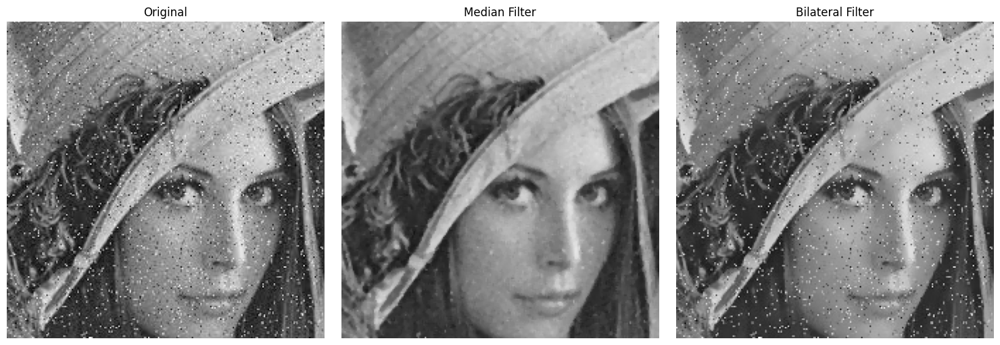

In [143]:
original_image = cv2.imread('../assets/images.jpeg')

# Apply Median Filter
median = cv2.medianBlur(src=original_image, ksize=3)                                                                                    # type: ignore

# Apply Bilateral Filter
# d: Kích thước vùng lân cận được sử dụng để lọc.
# sigmaColor: Điều khiển mức độ khác biệt màu sắc/cường độ được chấp nhận.
# sigmaSpace: Điều khiển mức độ ảnh hưởng của khoảng cách giữa các pixel.
bilateral = cv2.bilateralFilter(src=original_image, d=9, sigmaColor=50, sigmaSpace=75)                                                  # type: ignore

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Original image
axes[0].imshow(original_image)
axes[0].set_title("Original")
axes[0].axis("off")

# Median filter
axes[1].imshow(median)
axes[1].set_title("Median Filter")
axes[1].axis("off")

# Bilateral filter
axes[2].imshow(bilateral)
axes[2].set_title("Bilateral Filter")
axes[2].axis("off")

plt.tight_layout()
plt.show()

| Tiêu chí | Median Filter | Bilateral Filter |
| --- | --- | --- |
| **Khản năng loại bỏ nhiễu hạt** | **Xuất sắc.** Loại bỏ gần như hoàn toàn các hạt nhiễu muối tiêu (các chấm trắng/đen) ra khỏi ảnh. | **Kém.** Giữ lại rất nhiều hạt nhiễu li ti, không làm sạch được các đốm có độ tương phản cao. |
| **Độ rõ và mịn của chi tiết** | Các vùng chi tiết nhỏ (như sợi tóc, viền mắt) bị mờ nhẹ do hiệu ứng lấy giá trị trung vị. | Giữ cấu trúc biên rất tốt, làm mịn màng các vùng phẳng (như má, trán) nhưng bị loang lổ do nhiễu còn sót lại. |
| **Độ nhạy với loại nhiễu** | Cực kỳ hiệu quả với nhiễu xung (Salt and Pepper Noise). | Chỉ hiệu quả với nhiễu tuân theo phân phối chuẩn (Gaussian Noise), bất lực trước nhiễu hạt. |
| **Kết quả trên ảnh thử nghiệm** | Ảnh trông sạch sẽ, nền đều màu và cho kết quả trực quan tốt nhất. | Ảnh vẫn còn rất nhiều chấm nhiễu cô lập bám trên bề mặt nhân vật, kết quả không đạt yêu cầu. |
| **Ứng dụng** | Được ưu tiên hàng đầu khi tiền xử lý ảnh bị nhiễm nhiễu muối tiêu nặng. | Thường dùng khi cần làm mịn da, giảm nhiễu kỹ thuật số mà vẫn muốn giữ lại các đường cạnh sắc nét. |